# [ LG에너지솔루션 DX Expert 양성과정 ]

AnoViT를 활용한 image anomaly detection
- 이론교육 자료 [ link ](http://dsba.korea.ac.kr/wp-content/uploads/2023/06/9_2%E1%84%8C%E1%85%AE-4%E1%84%8B%E1%85%B5%E1%86%AF-Transformer-%E1%84%80%E1%85%B5%E1%86%B7%E1%84%86%E1%85%B5%E1%84%89%E1%85%AE%E1%86%A8.pdf)
- AnoViT: Unsupervised Anomaly Detection and Localization with Vision Transformer-based Encoder-Decoder. IEEE Access 2022. [ link ](https://arxiv.org/abs/2203.10808)

In [ ]:
# !pip install timm==0.9.2

# Import modules

In [ ]:
import os
import random
import copy
import cv2
import numpy as np

from glob import glob
from tqdm import tqdm
from copy import deepcopy

import torch
import torch.nn as nn
from torch.optim import AdamW, Adam, SGD
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from timm import create_model, list_models

from scipy.ndimage import gaussian_filter

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import roc_auc_score

/usr/local/lib/python3.10/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Functions

In [ ]:
def torch_seed(random_seed):
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed) # if use multi-GPU
    # CUDA randomness
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    np.random.seed(random_seed)
    random.seed(random_seed)
    os.environ['PYTHONHASHSEED'] = str(random_seed)


def train(
    model, dataloader, criterion, optimizer, log_interval: int, device: str) -> list:

    total_loss = []

    model.train()
    for i, (inputs, _, _) in enumerate(dataloader):

        # convert device
        inputs = inputs.to(device)

        # model outputs
        outputs = model(inputs)

        # loss
        loss = criterion(inputs, outputs).mean()
        total_loss.append(loss.item())

        # calculate gradients
        loss.backward()

        # update model weights
        optimizer.step()
        optimizer.zero_grad()

        # log learning history
        if i % log_interval == 0 or (i+1) == len(dataloader):
            print(f"{'TRAIN':5s} [{i+1:5d}/{len(dataloader):5d}] loss: {np.mean(total_loss):.4f}")

    # average loss
    avg_loss = np.mean(total_loss)

    return avg_loss

def test(
    model, dataloader, criterion, log_interval: int, device: str) -> list:

    # for image-level auroc
    total_loss_img = []
    total_targets = []
    # for pixel-level auroc
    total_masks = []
    total_loss_pixel = []

    torch_seed(223)

    model.eval()

    with torch.no_grad():
        for i, (inputs, masks, targets) in enumerate(dataloader):
            # get masks
            total_masks.append(masks.numpy())

            # get targets
            total_targets.extend(targets.tolist())

            # convert device
            inputs = inputs.to(device)

            # model outputs
            outputs = model(inputs)

            # loss
            loss = criterion(inputs, outputs)

            # loss image
            total_loss_img.extend(loss.flatten(start_dim=1).max(dim=1)[0].cpu().tolist())

            # loss pixel with gaussian filter
            loss = loss.mean(dim=1)
            loss_pixel = np.zeros_like(loss.cpu())
            for i, loss_b in enumerate(loss):
                loss_pixel[i] = gaussian_filter(deepcopy(loss_b.cpu()), sigma=6)
            total_loss_pixel.append(loss_pixel)

            # log learning history
            if i % log_interval == 0 or (i+1) == len(dataloader):
                print(f"{'TSET':5s} [{i+1:5d}/{len(dataloader):5d}] loss: {np.mean(total_loss_img):.4f}")

    # image-level auroc
    auroc_img = roc_auc_score(total_targets, total_loss_img)

    # pixel-level auroc
    total_loss_pixel = np.vstack(total_loss_pixel).reshape(-1)
    total_masks = np.vstack(total_masks).reshape(-1)
    auroc_pixel = roc_auc_score(total_masks, total_loss_pixel)

    # return
    return auroc_img, auroc_pixel


def fit(
    model, trainloader, testloader, criterion, optimizer,
    epochs: int, log_interval: int, device: str) -> list:

    train_history = []
    test_history_auroc_img = []
    test_history_auroc_pixel = []

    # fitting model
    for i in range(epochs):
        print(f'\nEpoch: [{i+1}/{epochs}]')
        train_loss = train(
            model        = model,
            dataloader   = trainloader,
            criterion    = criterion,
            optimizer    = optimizer,
            log_interval = log_interval,
            device       = device
        )

        test_auroc_img, test_auroc_pixel = test(
            model        = model,
            dataloader   = testloader,
            criterion    = criterion,
            log_interval = log_interval,
            device       = device
        )

        print(f'\nTest AUROC-image: {test_auroc_img:.4f}, AUROC-pixel: {test_auroc_pixel:.4f}')

        # show results
        with torch.no_grad():
            test_category = testloader.dataset.category
            fig, ax = plt.subplots(2, len(test_category), figsize=(2*len(test_category), 5))

            file_list_cat = list(map(lambda x: x.split('/')[-2], testloader.dataset.file_list))

            for i, c in enumerate(test_category):
                # select image per category
                idx = np.where(np.array(file_list_cat) == c)[0][0]
                img, mask, _ = testset[idx]

                # inference
                output = model(img.unsqueeze(0).to(device)).cpu()[0]

                # show image
                ax[0, i].imshow(img.permute(1,2,0))
                ax[1, i].imshow(output.permute(1,2,0))

                # axis off
                ax[0, i].axis('off')
                ax[1, i].axis('off')

                # set title
                ax[0, i].set_title(f"{c}\nimage")
                ax[1, i].set_title(f"{c}\nreconstruction")
            plt.tight_layout()
            plt.show()

        # stack history
        train_history.append(train_loss)
        test_history_auroc_img.append(test_auroc_img)
        test_history_auroc_pixel.append(test_auroc_pixel)

    return train_history, test_history_auroc_img, test_history_auroc_pixel


def figure(
    all_train_history: list, all_test_history_auroc_img: list,
    all_test_history_auroc_pixel: list, all_exp_name: list) -> None:

    fig, ax = plt.subplots(1, 3, figsize=(15,5))

    # train line plot
    for i, (train_h, exp_name) in enumerate(zip(all_train_history, all_exp_name)):
        sns.lineplot(
            x     = range(1, len(train_h)+1),
            y     = train_h,
            label = exp_name,
            ax    = ax[0]
        )

    # test image-level AUROC lineplot
    for i, (test_h, exp_name) in enumerate(zip(all_test_history_auroc_img, all_exp_name)):
        sns.lineplot(
            x     = range(1, len(test_h)+1),
            y     = test_h,
            label = exp_name,
            ax    = ax[1]
        )

    # test pixel-level AUROC lineplot
    for i, (test_h, exp_name) in enumerate(zip(all_test_history_auroc_pixel, all_exp_name)):
        sns.lineplot(
            x     = range(1, len(test_h)+1),
            y     = test_h,
            label = exp_name,
            ax    = ax[2]
        )

    # set y axis label
    ax[0].set_ylabel('MSE Loss')
    ax[1].set_ylabel('AUROC(image-level)')
    ax[2].set_ylabel('AUROC(pixel-level)')

    # set x axis label
    ax[0].set_xlabel('Epochs')
    ax[1].set_xlabel('Epochs')
    ax[2].set_xlabel('Epochs')

    # set title
    ax[0].set_title('Train loss history')
    ax[1].set_title('Test AUROC(image-level) history')
    ax[2].set_title('Test AUROC(pixel-level) history')

    # set y value limit
    max_train = np.max(all_train_history)

    ax[0].set_ylim(0, max_train+0.01)
    ax[1].set_ylim(0, 1)
    ax[2].set_ylim(0, 1)

    # set legend
    ax[0].legend(loc='upper left')
    ax[1].legend(loc='upper left')
    ax[2].legend(loc='upper left')
    plt.tight_layout()
    plt.show()

# Configuration for experiments

In [ ]:
class Config:
    # dataset 관련 parameters
    datadir = './data'
    target = 'grid'
    image_size = 384
    patch_size = 16
    mean = [0.4474, 0.4474, 0.4474]
    std = [0.1632, 0.1632, 0.1632]

    # training 관련 parameters
    epochs = 20
    batch_size = 8
    test_batch_size = 128
    learning_rate = 0.0001
    num_workers = 2
    log_interval = 2000

    # device
    device = 'cuda'

    # seed
    seed = 223

cfg = Config()

# Load dataset and dataloader

**Download data**
- MVTec AD [ [link](https://www.mvtec.com/company/research/datasets/mvtec-ad) ]

In [ ]:
# !wget -P './data' 'https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937487-1629951814/grid.tar.xz'
# !tar Jxvf ./data/grid.tar.xz -C ./data

```bash
    
./data/grid
├── ground_truth
│   ├── bent
│   ├── broken
│   ├── glue
│   ├── metal_contamination
│   └── thread
├── license.txt
├── readme.txt
├── test
│   ├── bent
│   ├── broken
│   ├── glue
│   ├── good
│   ├── metal_contamination
│   └── thread
└── train
    └── good
```

In [ ]:
print('[ trainset ]')
print(f"train good images: {len(glob(os.path.join(cfg.datadir, cfg.target, 'train/good/*')))}")
print('\n[ testset ]')
testdir = os.path.join(cfg.datadir, cfg.target, 'test')
for name in os.listdir(testdir):
    print(f"test {name} images: {len(glob(os.path.join(testdir, name, '*')))}")

[ trainset ]
train good images: 264

[ testset ]
test bent images: 12
test glue images: 11
test thread images: 11
test good images: 21
test metal_contamination images: 11
test broken images: 12


In [ ]:
class MVTecAD(Dataset):
    def __init__(
        self, datadir: str, target: str, train: bool,
        img_size: int, transform: transforms.Compose):

        self.datadir = os.path.join(datadir, target)
        self.train = train

        self.category = os.listdir(os.path.join(self.datadir, 'train' if train else 'test'))

        self.img_size = (img_size, img_size)
        self.transform = transform

        self.file_list = glob(os.path.join(self.datadir, 'train' if self.train else 'test', '*/*'))


    def __getitem__(self, idx):
        file_path = self.file_list[idx]

        # image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, dsize=self.img_size)

        # target
        target = 0 if 'good' in file_path else 1

        # mask
        if 'good' in file_path:
            mask = np.zeros(self.img_size, dtype=np.float32)
        else:
            mask = cv2.imread(
                file_path.replace('test','ground_truth').replace('.png','_mask.png'),
                cv2.IMREAD_GRAYSCALE
            )
            mask = cv2.resize(mask, dsize=self.img_size).astype(bool).astype(int)

        img = self.transform(img)
        mask = torch.Tensor(mask).to(torch.int64)

        return img, mask, target

    def __len__(self):
        return len(self.file_list)

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(cfg.mean, cfg.std)
])

# define dataset and dataloader
trainset = MVTecAD(
    datadir   = cfg.datadir,
    target    = cfg.target,
    img_size  = cfg.image_size,
    transform = transforms.ToTensor(),
    train     = True
)

testset = MVTecAD(
    datadir   = cfg.datadir,
    target    = cfg.target,
    img_size  = cfg.image_size,
    transform = transforms.ToTensor(),
    train     = False
)

trainloader = DataLoader(trainset, batch_size=cfg.batch_size, shuffle=True, num_workers=cfg.num_workers)
testloader = DataLoader(testset, batch_size=cfg.test_batch_size, shuffle=False, num_workers=cfg.num_workers)

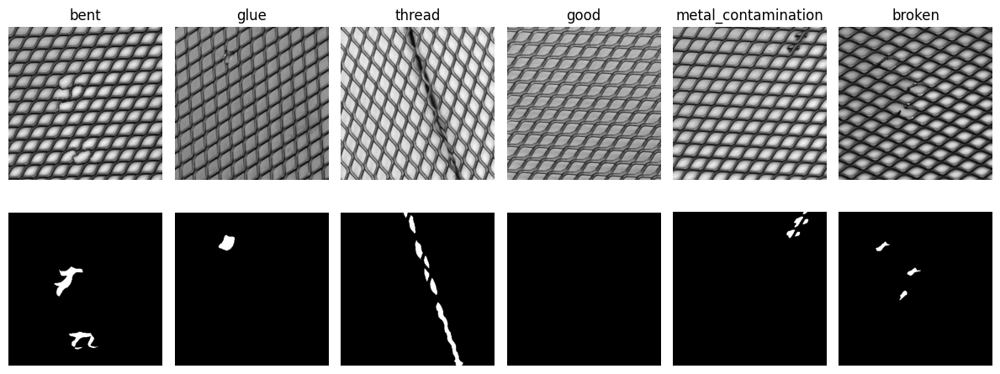

In [ ]:
fig, ax = plt.subplots(2, len(testset.category), figsize=(2*len(testset.category), 5))

file_list_cat = list(map(lambda x: x.split('/')[-2], testset.file_list))

for i, c in enumerate(testset.category):
    idx = np.where(np.array(file_list_cat) == c)[0][0]
    img, mask, _ = testset[idx]
    img = (img - img.min()) / (img.max() - img.min())
    ax[0, i].imshow(img.permute(1,2,0))
    ax[1, i].imshow(mask, cmap='gray')

    # axis off
    ax[0, i].axis('off')
    ax[1, i].axis('off')

    # set title
    ax[0, i].set_title(c)
plt.tight_layout()
plt.show()

# AnoViT

![image](https://github.com/yukyunglee/LG_ES_Transformer/assets/37654013/8a4f0113-9830-4e5c-985d-b95446073512)


In [ ]:
class Decoder(nn.Module):
    def __init__(self, image_size: int, patch_size: int):
        super(Decoder, self).__init__()
        self.image_size = image_size
        self.patch_size = patch_size

        self.dec_block1 = nn.Sequential(
            nn.ConvTranspose2d(768, 256, (3, 3)),
            nn.InstanceNorm2d(256),
            nn.ReLU(True)
        )

        self.dec_block2 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, (3, 3)),
            nn.InstanceNorm2d(128),
            nn.ReLU(True)
        )

        self.dec_block3 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, (3, 3)),
            nn.InstanceNorm2d(64),
            nn.ReLU(True)
        )

        self.dec_block4 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, (3, 3), stride=2, padding=1),
            nn.InstanceNorm2d(32),
            nn.ReLU(True)
        )

        self.dec_block5 = nn.Sequential(
            nn.ConvTranspose2d(32, 16, (3, 3), stride=2, padding=1),
            nn.InstanceNorm2d(16),
            nn.ReLU(True)
        )

        self.up = nn.UpsamplingBilinear2d((image_size, image_size)) # fixed output size

        self.output = nn.Conv2d(16, 3, (3,3), stride=1, padding=1)

    def forward(self,x):
        out = x.transpose(1,2)
        out = out.reshape(x.shape[0], -1, self.image_size//self.patch_size, self.image_size//self.patch_size)
        out = self.dec_block1(out)
        out = self.dec_block2(out)
        out = self.dec_block3(out)
        out = self.dec_block4(out)
        out = self.dec_block5(out)
        out = self.up(out)
        out = self.output(out)
        out = nn.functional.sigmoid(out)

        return out

class AnoViT(nn.Module):
    def __init__(self, encoder_modelname: str, image_size: int, patch_size: int):
        super().__init__()

        # encoder
        self.encoder = create_model(encoder_modelname, pretrained=True)
        for p in self.encoder.head.parameters():
            if p.requires_grad:
                p.requires_grad = False

        # decoder
        self.decoder = Decoder(image_size=image_size, patch_size=patch_size)

    def forward(self, x):
        out = self.encoder.forward_features(x)[:,1:]
        out = self.decoder(out)

        return out

In [ ]:
# gradients scaler
anovit = AnoViT(
    encoder_modelname = 'vit_base_patch16_384.augreg_in21k_ft_in1k',
    image_size        = cfg.image_size,
    patch_size        = cfg.patch_size
)

anovit.to(cfg.device)

criterion = nn.MSELoss(reduction='none')
optimizer = Adam(anovit.parameters(), lr=cfg.learning_rate, betas=(0.5, 0.999))

print('Load AnoViT')
print('The number of model parameters: ',sum([p.numel() for p in anovit.parameters() if p.requires_grad]))

Load AnoViT
The number of model parameters:  88252579


In [ ]:
temp = torch.randn(1,3,384,384)
print('input: ',temp.shape)
encoder_output = anovit.encoder.forward_features(temp.to(cfg.device))[:,1:]
print('encoder output: ',encoder_output.shape)
decoder_output = anovit.decoder(encoder_output)
print('decoder output: ',decoder_output.shape)

input:  torch.Size([1, 3, 384, 384])
encoder output:  torch.Size([1, 576, 768])
decoder output:  torch.Size([1, 3, 384, 384])



Epoch: [1/20]
TRAIN [    1/   33] loss: 0.0368
TRAIN [   33/   33] loss: 0.0300

Test AUROC-image: 0.6458, AUROC-pixel: 0.7115


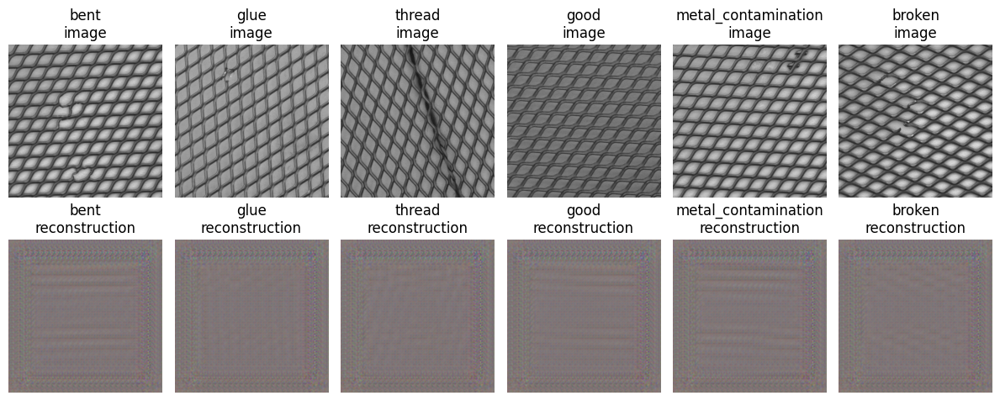


Epoch: [2/20]
TRAIN [    1/   33] loss: 0.0243
TRAIN [   33/   33] loss: 0.0260

Test AUROC-image: 0.6391, AUROC-pixel: 0.7274


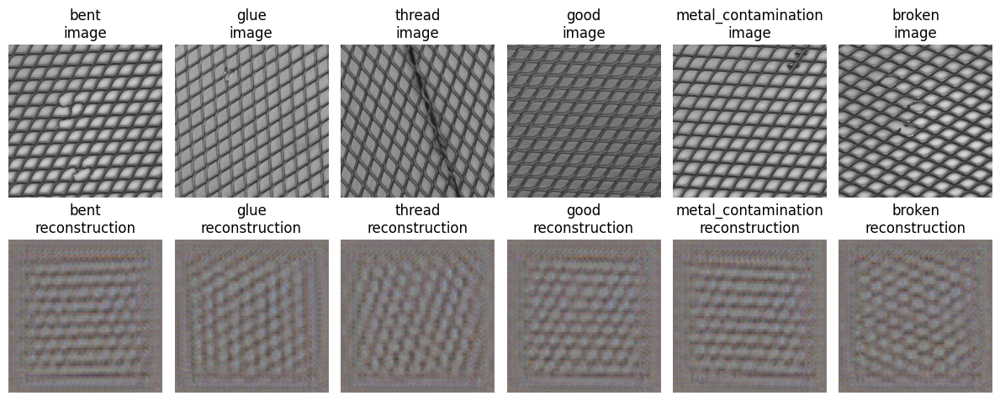


Epoch: [3/20]
TRAIN [    1/   33] loss: 0.0199
TRAIN [   33/   33] loss: 0.0192

Test AUROC-image: 0.7260, AUROC-pixel: 0.8064


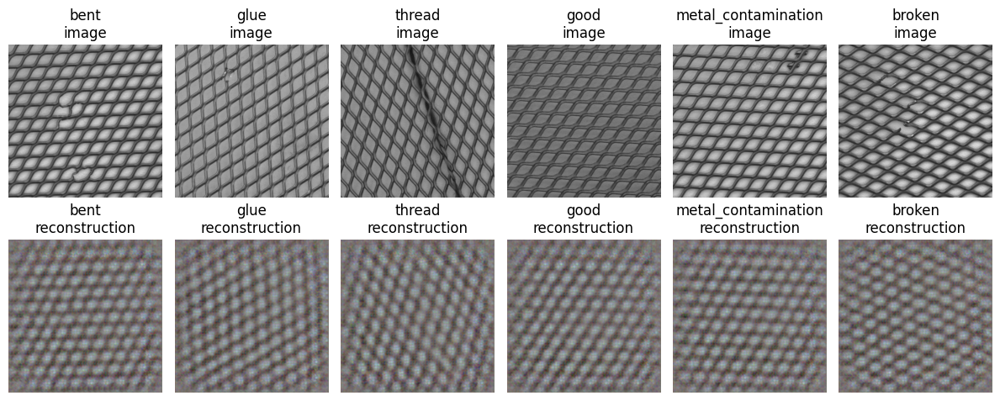


Epoch: [4/20]
TRAIN [    1/   33] loss: 0.0143
TRAIN [   33/   33] loss: 0.0134

Test AUROC-image: 0.8596, AUROC-pixel: 0.8618


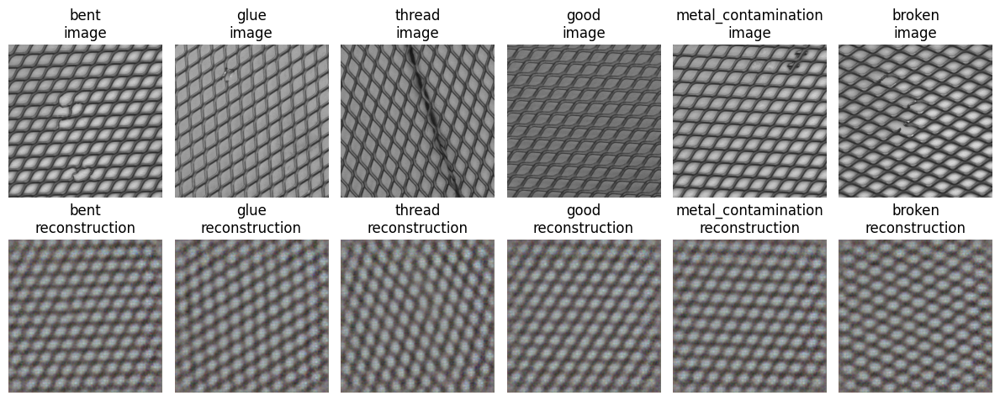


Epoch: [5/20]
TRAIN [    1/   33] loss: 0.0110
TRAIN [   33/   33] loss: 0.0113

Test AUROC-image: 0.8521, AUROC-pixel: 0.8717


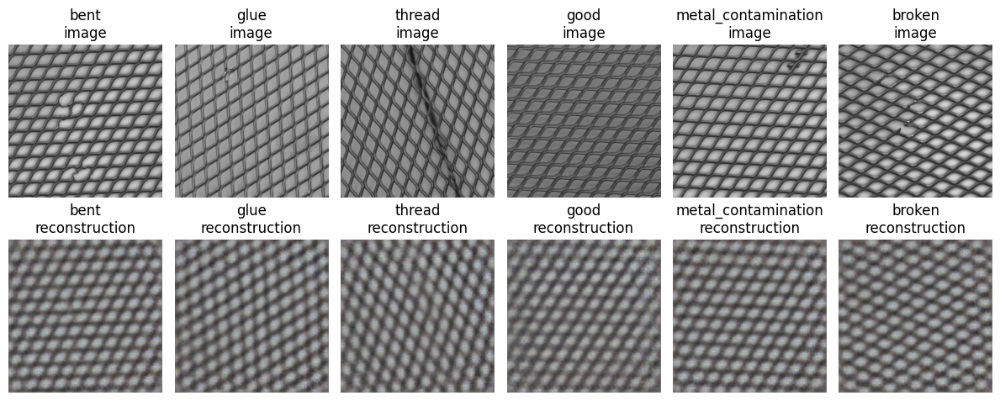


Epoch: [6/20]
TRAIN [    1/   33] loss: 0.0100
TRAIN [   33/   33] loss: 0.0106

Test AUROC-image: 0.9231, AUROC-pixel: 0.8512


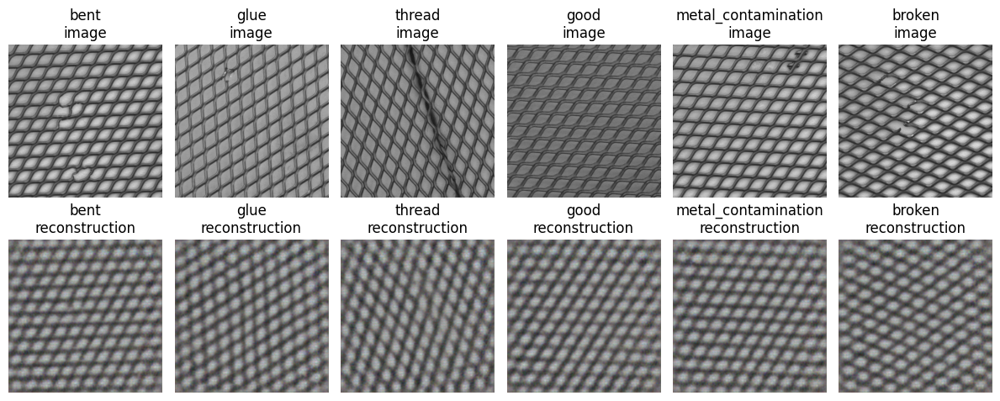


Epoch: [7/20]
TRAIN [    1/   33] loss: 0.0112
TRAIN [   33/   33] loss: 0.0096

Test AUROC-image: 0.9223, AUROC-pixel: 0.8825


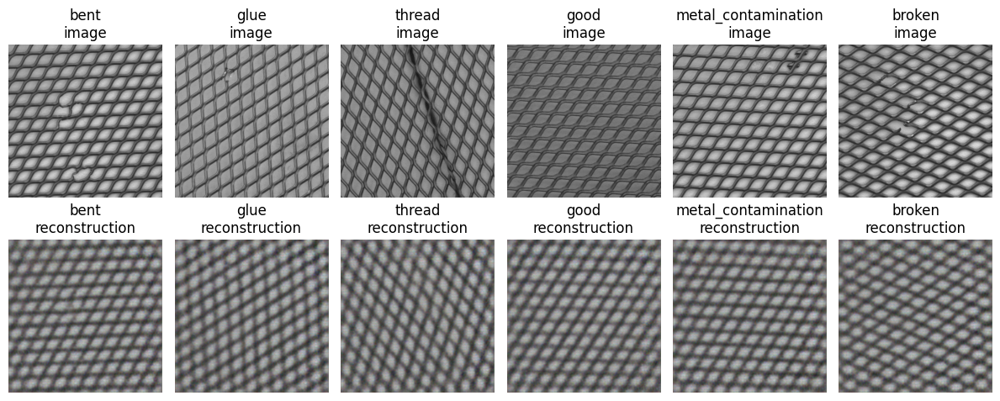


Epoch: [8/20]
TRAIN [    1/   33] loss: 0.0096
TRAIN [   33/   33] loss: 0.0088

Test AUROC-image: 0.9156, AUROC-pixel: 0.8875


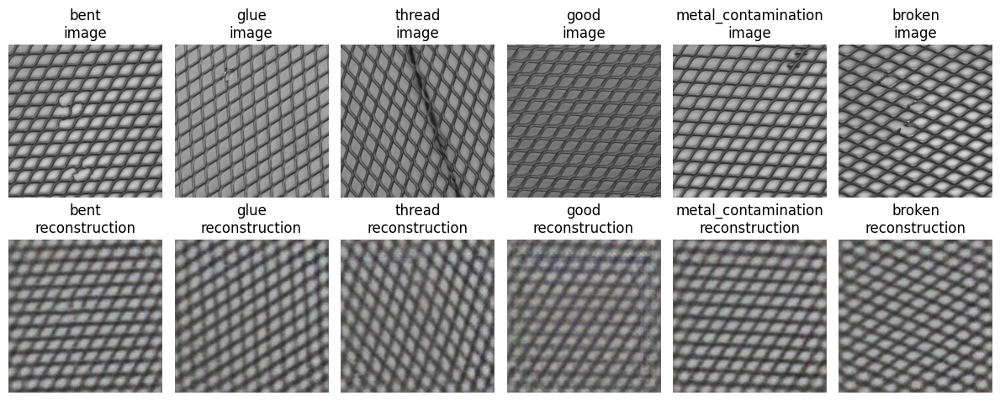


Epoch: [9/20]
TRAIN [    1/   33] loss: 0.0089
TRAIN [   33/   33] loss: 0.0086

Test AUROC-image: 0.8822, AUROC-pixel: 0.8879


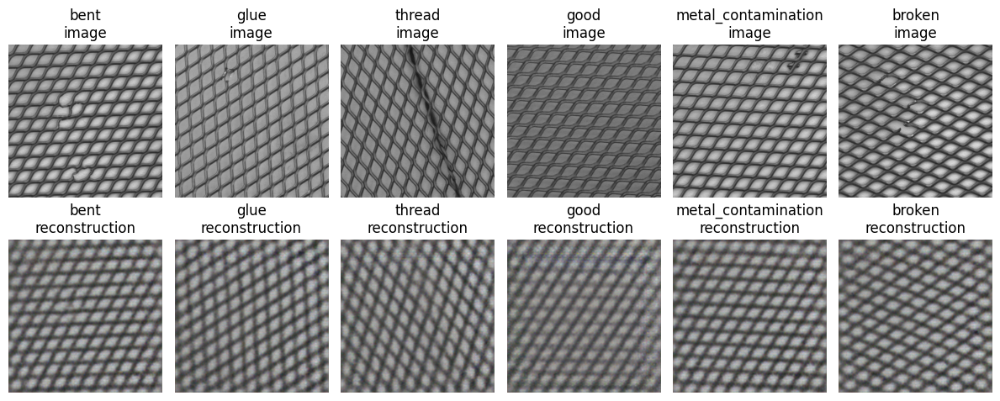


Epoch: [10/20]
TRAIN [    1/   33] loss: 0.0085
TRAIN [   33/   33] loss: 0.0080

Test AUROC-image: 0.8939, AUROC-pixel: 0.8797


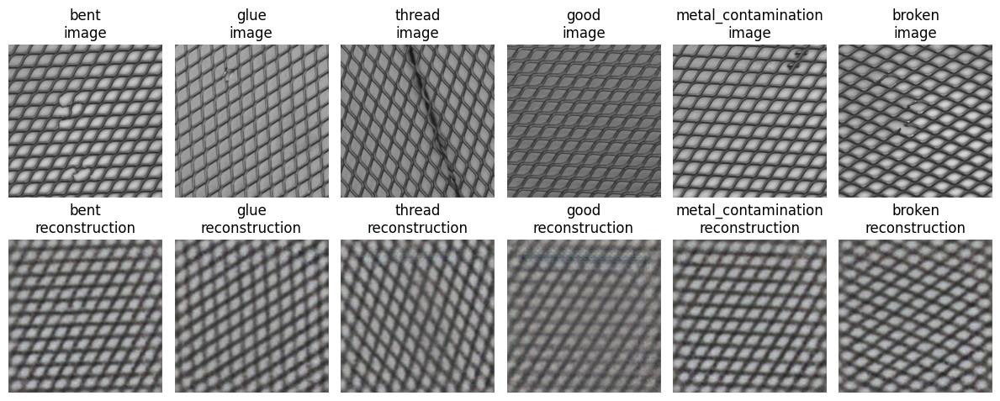


Epoch: [11/20]
TRAIN [    1/   33] loss: 0.0085
TRAIN [   33/   33] loss: 0.0080

Test AUROC-image: 0.8713, AUROC-pixel: 0.8967


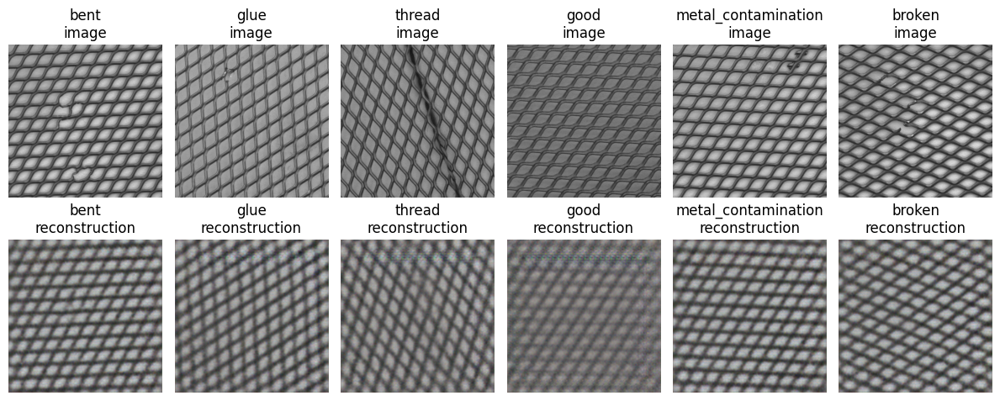


Epoch: [12/20]
TRAIN [    1/   33] loss: 0.0074
TRAIN [   33/   33] loss: 0.0072

Test AUROC-image: 0.8889, AUROC-pixel: 0.9059


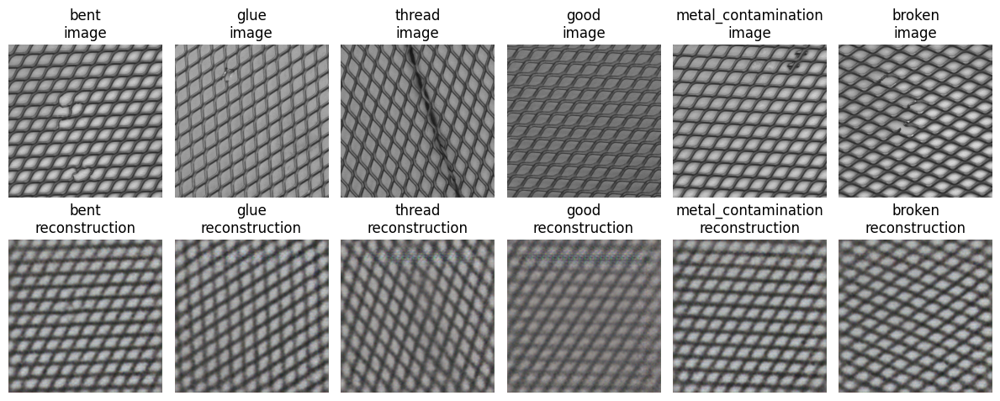


Epoch: [13/20]
TRAIN [    1/   33] loss: 0.0071
TRAIN [   33/   33] loss: 0.0072

Test AUROC-image: 0.9064, AUROC-pixel: 0.9112


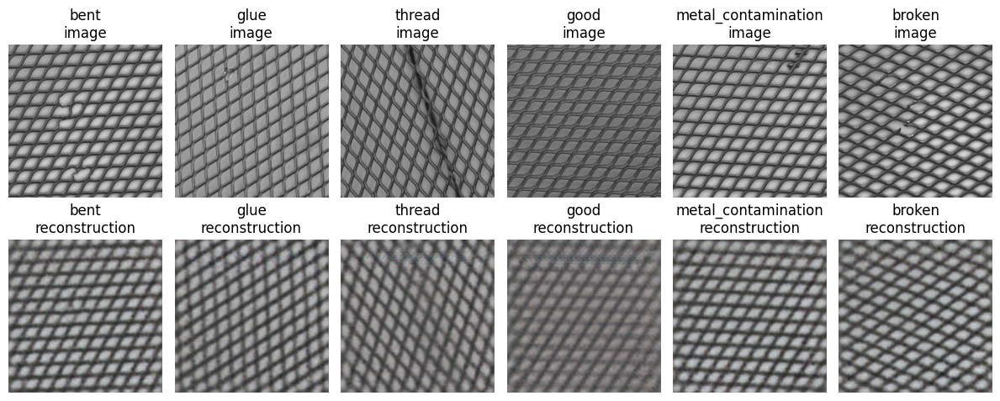


Epoch: [14/20]
TRAIN [    1/   33] loss: 0.0068
TRAIN [   33/   33] loss: 0.0065

Test AUROC-image: 0.8956, AUROC-pixel: 0.9157


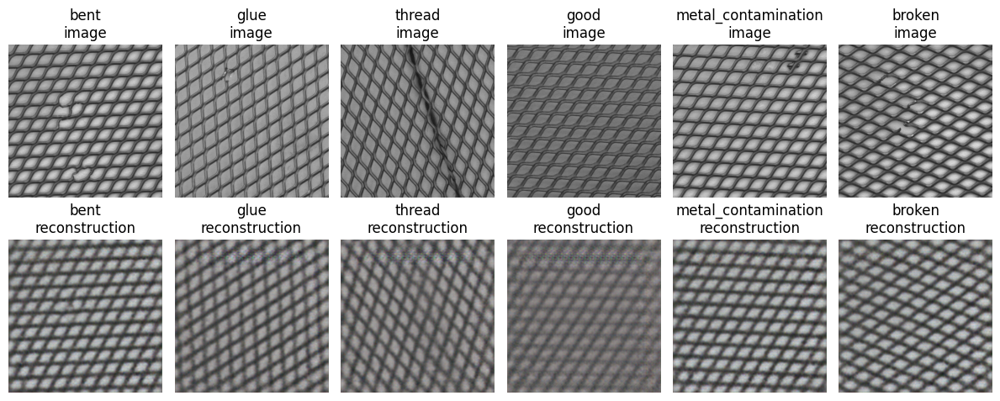


Epoch: [15/20]
TRAIN [    1/   33] loss: 0.0064
TRAIN [   33/   33] loss: 0.0063

Test AUROC-image: 0.8956, AUROC-pixel: 0.8955


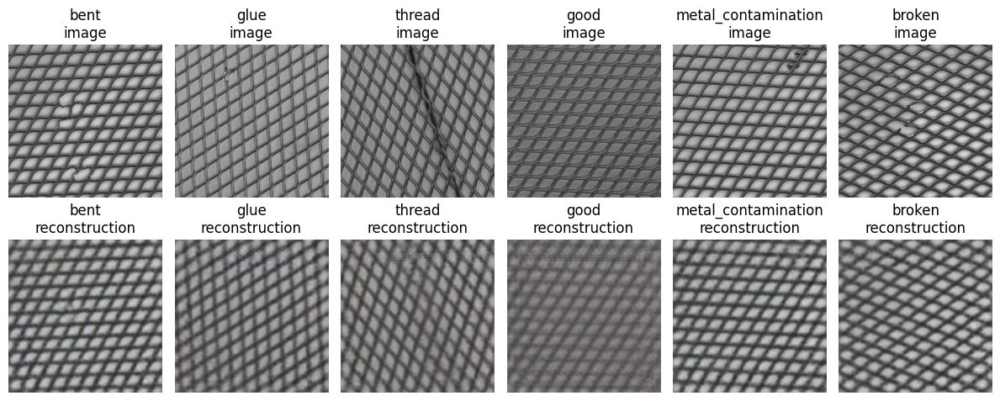


Epoch: [16/20]
TRAIN [    1/   33] loss: 0.0065
TRAIN [   33/   33] loss: 0.0063

Test AUROC-image: 0.8889, AUROC-pixel: 0.8892


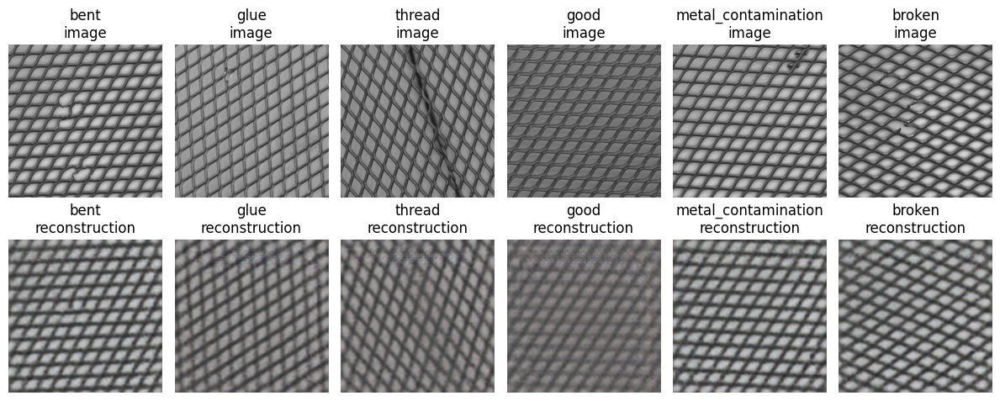


Epoch: [17/20]
TRAIN [    1/   33] loss: 0.0066
TRAIN [   33/   33] loss: 0.0063

Test AUROC-image: 0.9023, AUROC-pixel: 0.9071


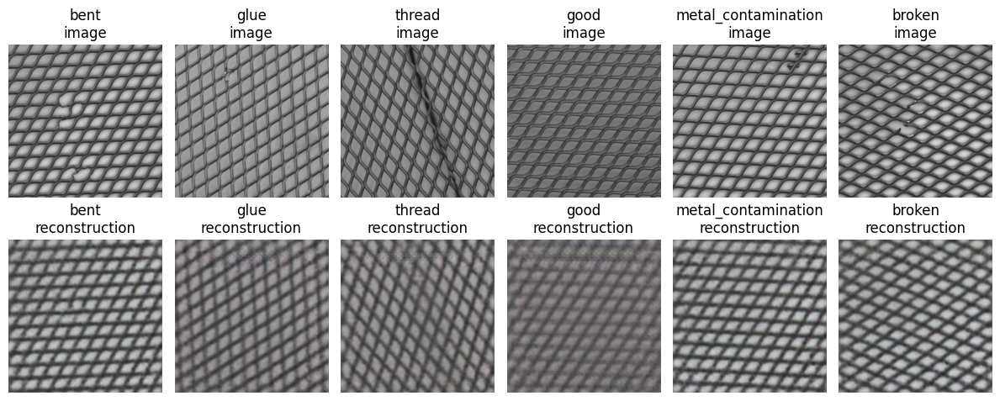


Epoch: [18/20]
TRAIN [    1/   33] loss: 0.0061
TRAIN [   33/   33] loss: 0.0058

Test AUROC-image: 0.8739, AUROC-pixel: 0.9066


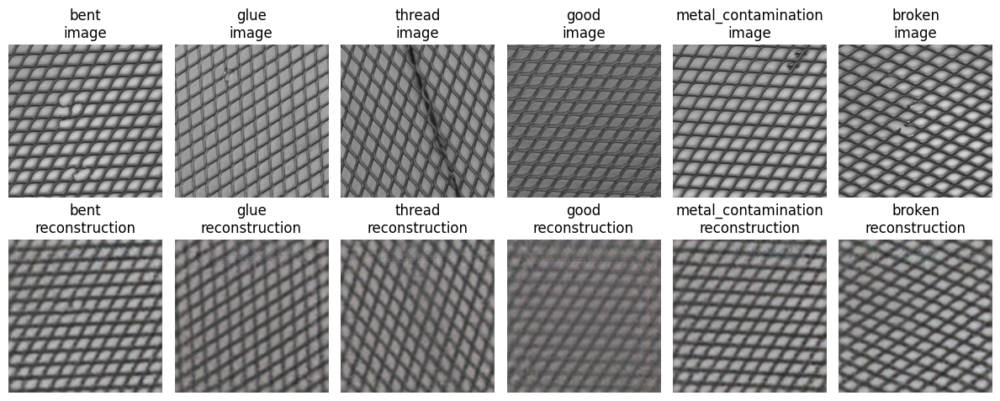


Epoch: [19/20]
TRAIN [    1/   33] loss: 0.0063
TRAIN [   33/   33] loss: 0.0056

Test AUROC-image: 0.9190, AUROC-pixel: 0.9157


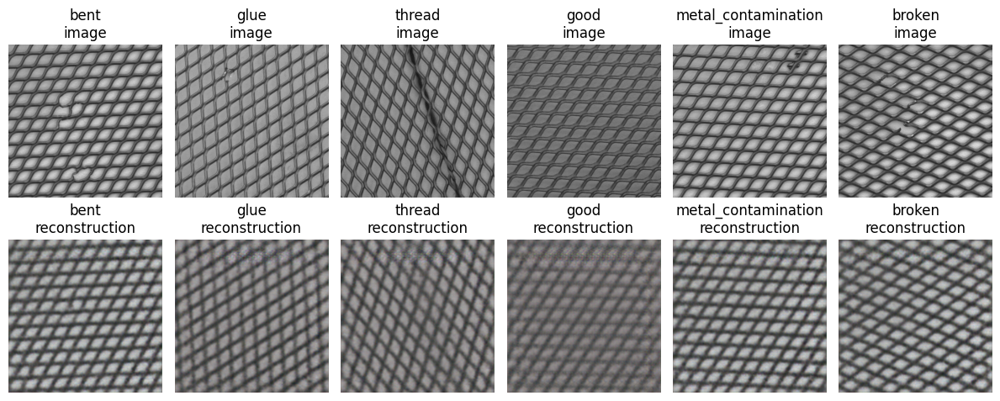


Epoch: [20/20]
TRAIN [    1/   33] loss: 0.0056
TRAIN [   33/   33] loss: 0.0053

Test AUROC-image: 0.9215, AUROC-pixel: 0.9157


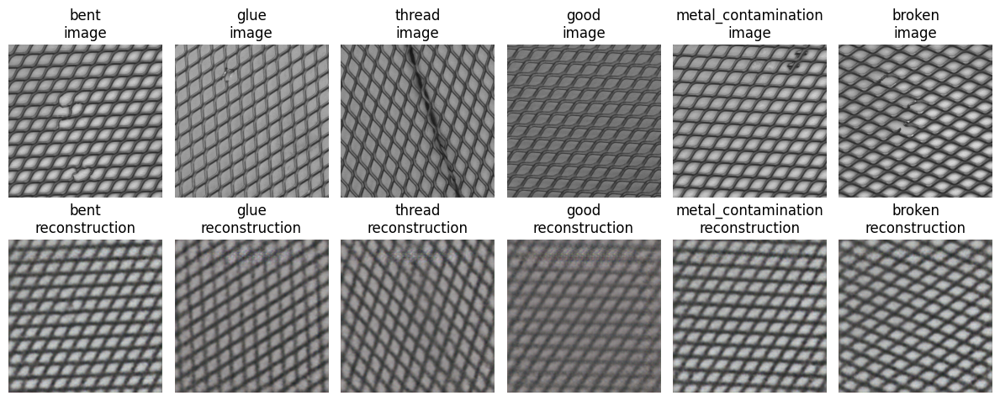

In [ ]:
torch_seed(cfg.seed)
train_history, test_history_auroc_img, test_history_auroc_pixel = fit(
    model        = anovit,
    trainloader  = trainloader,
    testloader   = testloader,
    criterion    = criterion,
    optimizer    = optimizer,
    epochs       = cfg.epochs,
    log_interval = cfg.log_interval,
    device       = cfg.device
)

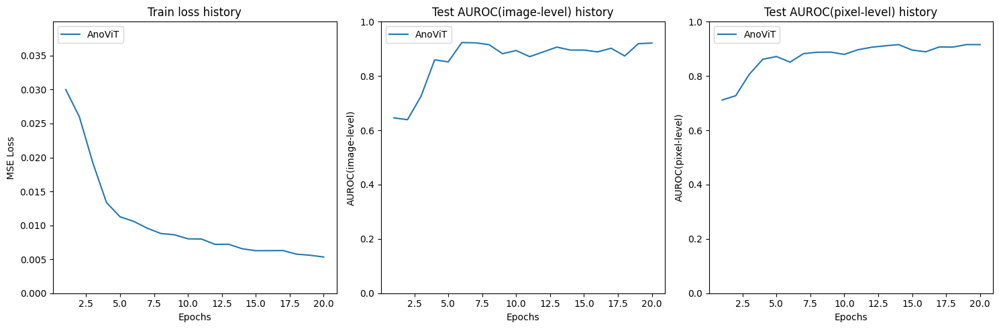

In [ ]:
all_train_history = [train_history]
all_test_history_auroc_img = [test_history_auroc_img]
all_test_history_auroc_pixel = [test_history_auroc_pixel]
all_exp_name = ['AnoViT']

figure(
    all_train_history            = all_train_history,
    all_test_history_auroc_img   = all_test_history_auroc_img,
    all_test_history_auroc_pixel = all_test_history_auroc_pixel,
    all_exp_name                 = all_exp_name
)

# Anomaly score distribution

In [ ]:
# category file list
file_list_cat = list(map(lambda x: x.split('/')[-2], testset.file_list))

# loss function
criterion = nn.MSELoss(reduction='none')

# inference
total_loss = []

anovit.eval()
with torch.no_grad():
    for (inputs, _, _) in testloader:
        inputs = inputs.to(cfg.device)
        outputs = anovit(inputs)
        loss = criterion(inputs, outputs).mean(dim=1)
        total_loss.extend(loss.flatten(start_dim=1).max(dim=1)[0].cpu().tolist())


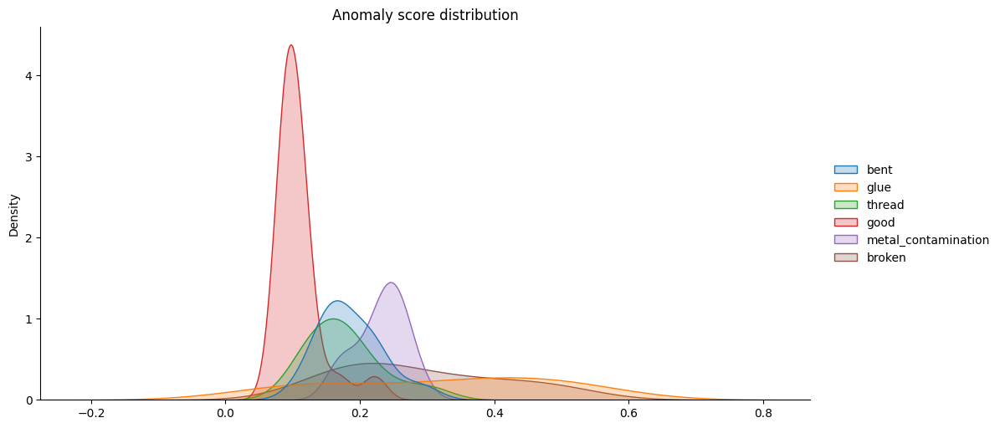

In [ ]:
sns.displot(
    x      = total_loss,
    hue    = file_list_cat,
    kind   = 'kde',
    fill   = True,
    aspect = 2
)
plt.title('Anomaly score distribution')
plt.show()

# Anomaly visualization

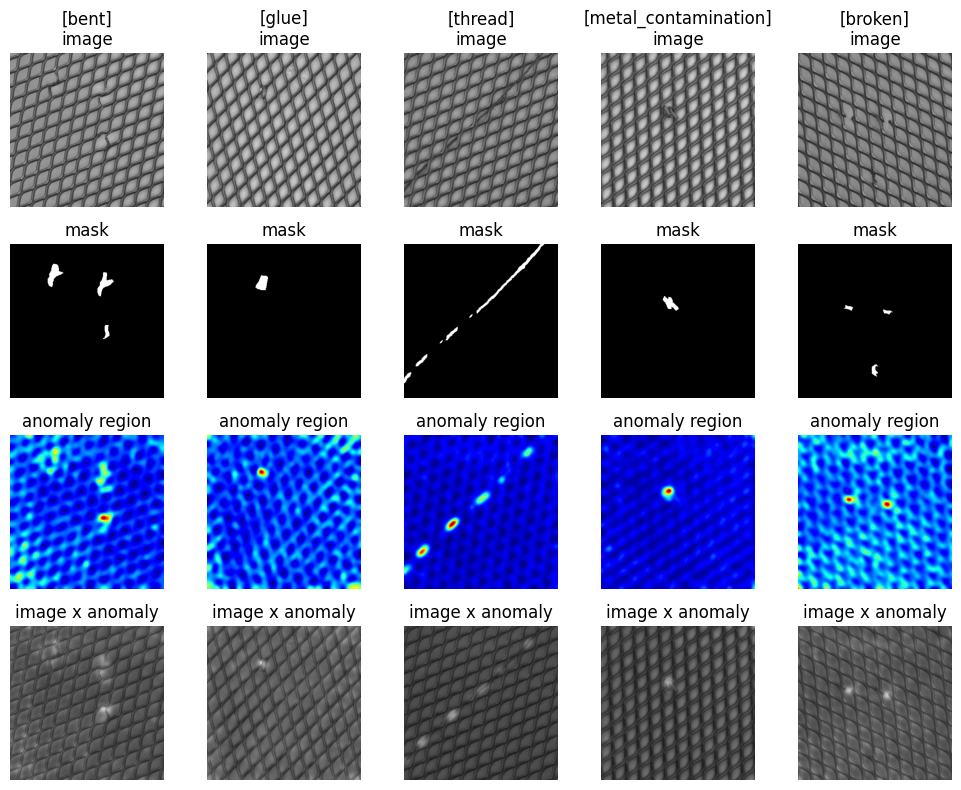

In [ ]:
# category file list
file_list_cat = list(map(lambda x: x.split('/')[-2], testset.file_list))
cats = testset.category.copy()
cats.remove('good')

# set row name
row_name = ['image', 'mask', 'anomaly region', 'image x anomaly']

fig, ax = plt.subplots(4, len(cats), figsize=(2*len(cats), 8))

# loss function
criterion = nn.MSELoss(reduction='none')

anovit.eval()
for i, c in enumerate(cats):
    if c == 'good':
        continue
    # get index per category
    idx = np.where(np.array(file_list_cat) == c)[0][1]

    # get image and mask
    img, mask, _ = testset[idx]

    # get loss output
    with torch.no_grad():
        output = anovit(img.unsqueeze(0).to(cfg.device))[0].cpu()
        loss = criterion(img, output).mean(dim=0)

    # gaussian filter
    loss = gaussian_filter(loss, sigma=6)
    loss = (loss - loss.min()) / (loss.max() - loss.min())

    # blend image with anomaly
    blend = img.permute(1,2,0)*0.5 + (np.expand_dims(loss*0.5, axis=-1))

    # show image
    ax[0, i].imshow(img.permute(1,2,0))
    ax[1, i].imshow(mask, cmap='gray')
    ax[2, i].imshow(loss, cmap='jet')
    ax[3, i].imshow(blend)

    # axis off
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
    ax[3, i].axis('off')

    # set title
    for r_idx, ax_r in enumerate(ax[:, i]):
        ax_r.set_title(f'[{c}]\n{row_name[r_idx]}' if r_idx==0 else row_name[r_idx])

plt.tight_layout()
plt.show()